<a href="https://colab.research.google.com/github/jaya1910/jaya1910/blob/main/TEJA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/My Drive/Colab Notebooks/

/content/drive/My Drive/Colab Notebooks


In [ ]:
!ls "/content/drive/MyDrive/MINOR"

MANGO  MUSKMELON  ORANGO  PEACH  PEAR  PERSIMMON  PITAYA  PLUM	POMEGRANATE  TOMATOES


In [ ]:
import warnings
warnings.filterwarnings("ignore")

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras.utils import to_categorical

In [ ]:
base_dir = '/content/drive/MyDrive/MINOR'
class_labels = os.listdir(base_dir)
class_labels.sort()
print(class_labels)

['MANGO', 'MUSKMELON', 'ORANGO', 'PEACH', 'PEAR', 'PERSIMMON', 'PITAYA', 'PLUM', 'POMEGRANATE', 'TOMATOES']


In [ ]:
chart_data = []
for target in class_labels:
    path = os.path.join(base_dir, target)
    size = len(os.listdir(path))
    chart_data.append(size)
    print(f'The target {target} has {size} samples in the dataset')

The target MANGO has 250 samples in the dataset
The target MUSKMELON has 248 samples in the dataset
The target ORANGO has 250 samples in the dataset
The target PEACH has 251 samples in the dataset
The target PEAR has 250 samples in the dataset
The target PERSIMMON has 250 samples in the dataset
The target PITAYA has 265 samples in the dataset
The target PLUM has 250 samples in the dataset
The target POMEGRANATE has 261 samples in the dataset
The target TOMATOES has 252 samples in the dataset


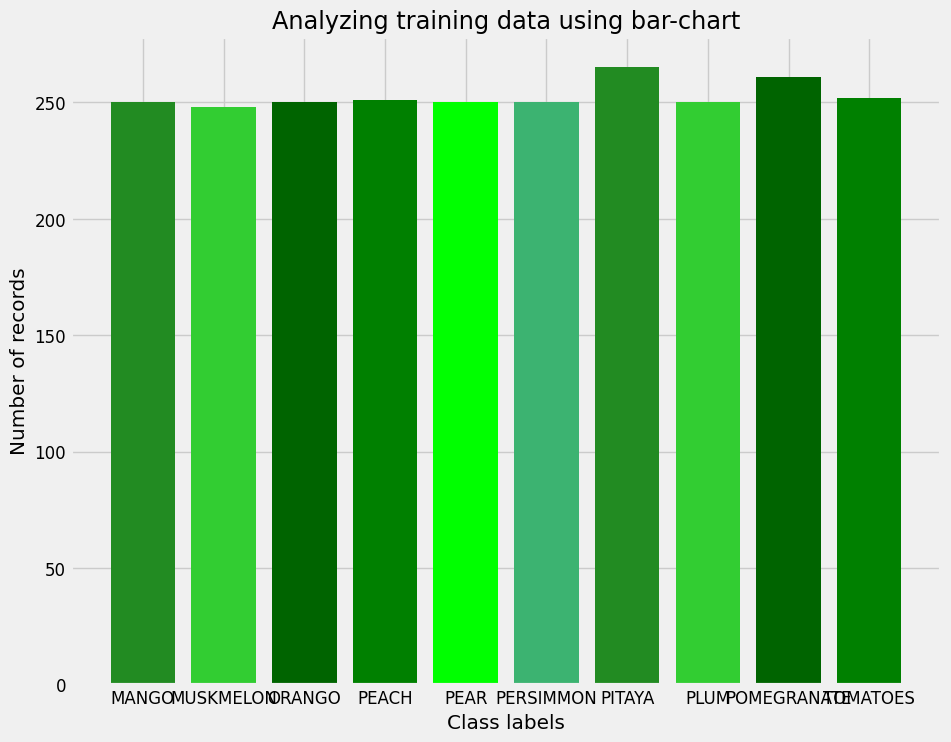

In [ ]:
with plt.style.context(style='fivethirtyeight'):
    plt.figure(figsize=(10, 8))
    plt.rcParams['font.size'] = 12
    plt.bar(x=class_labels,
            height=chart_data,
            color=["forestgreen", "limegreen", "darkgreen", "green", "lime", "mediumseagreen"])
    plt.title(label="Analyzing training data using bar-chart")
    plt.xlabel(xlabel="Class labels")
    plt.ylabel(ylabel="Number of records")
    plt.show()

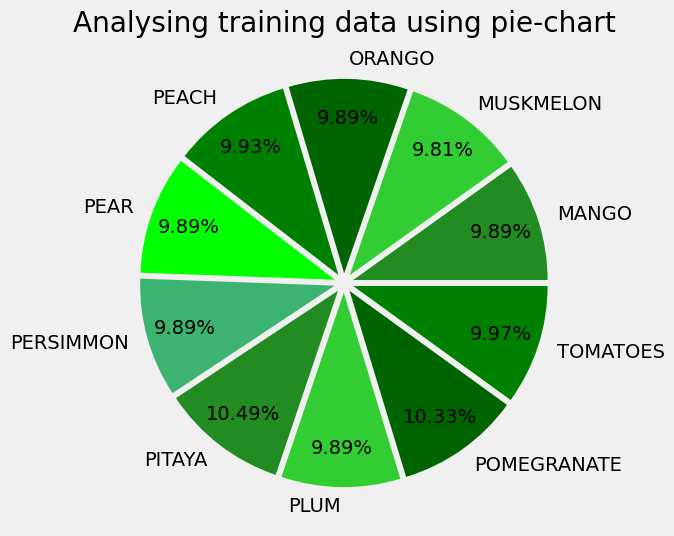

In [ ]:
with  plt.style.context(style="fivethirtyeight"):
    plt.figure(figsize=(6, 6))
    explode = [0.05] * len(chart_data)
    plt.pie(x=chart_data,
        colors=["forestgreen", "limegreen", "darkgreen", "green", "lime", "mediumseagreen"],
        labels=class_labels,
        autopct='%.2f%%',
        pctdistance=0.80,
        explode=explode)

    plt.title(label="Analysing training data using pie-chart")
    plt.show()

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Base directory containing class folders
base_dir = "/content/drive/MyDrive/MINOR"  # Replace with your dataset path

# Get class labels (folder names) from the base directory
class_labels = [folder for folder in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, folder))]
print(f"Class labels: {class_labels}")

# Initialize data and labels
data = []
labels = []
count = 0

# Loop through each class label
for target in tqdm(class_labels):
    path = os.path.join(base_dir, target)

    # Ensure the target is a directory
    if not os.path.isdir(path):
        print(f"Warning: Skipping non-directory entry: {path}")
        continue

    # Get list of files in the directory
    image_names = os.listdir(path)

    for image_name in image_names:
        image_path = os.path.join(path, image_name)

        # Skip files that are not images
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            print(f"Warning: Skipping non-image file: {image_path}")
            continue

        # Skip if the file doesn't exist
        if not os.path.exists(image_path):
            print(f"Warning: File does not exist: {image_path}")
            continue

        try:
            # Read the image
            image = cv2.imread(image_path)

            # Skip if the image could not be read
            if image is None:
                print(f"Warning: Failed to load image: {image_path}")
                continue

            # Convert BGR to RGB
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Resize the image
            image = cv2.resize(image, (128, 128))  # You can adjust the size as needed

            # Normalize the image
            image = image / 255.0

            # Append the image and its label
            data.append(image)
            labels.append(count)

        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

    # Increment the class label counter
    count += 1

# Convert the data and labels to numpy arrays for better performance
data = np.array(data, dtype=np.float32)
labels = np.array(labels, dtype=np.int32)

print(f"Data shape: {data.shape}")
print(f"Labels shape: {labels.shape}")


Class labels: ['MANGO', 'TOMATOES', 'PEACH', 'ORANGO', 'PERSIMMON', 'MUSKMELON', 'PLUM', 'PEAR', 'PITAYA', 'POMEGRANATE']


100%|██████████| 10/10 [00:59<00:00,  5.93s/it]


Data shape: (2527, 128, 128, 3)
Labels shape: (2527,)


In [ ]:
data=np.array(data)
labels=np.array(labels)
print(data.shape, labels.shape)

(2527, 128, 128, 3) (2527,)


In [ ]:
import matplotlib.pyplot as plt  # Import matplotlib.pyplot


In [ ]:
from random import randint
def show_images (X,y,class_names):
    plt.figure(figsize=(10, 10))
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        idx = randint(0, X.shape[0]-1)
        plt.imshow(X[idx])
        plt.axis("off")
        plt.title("Class:{}".format(class_names[y[idx]]))
    plt.tight_layout()
    plt.show()

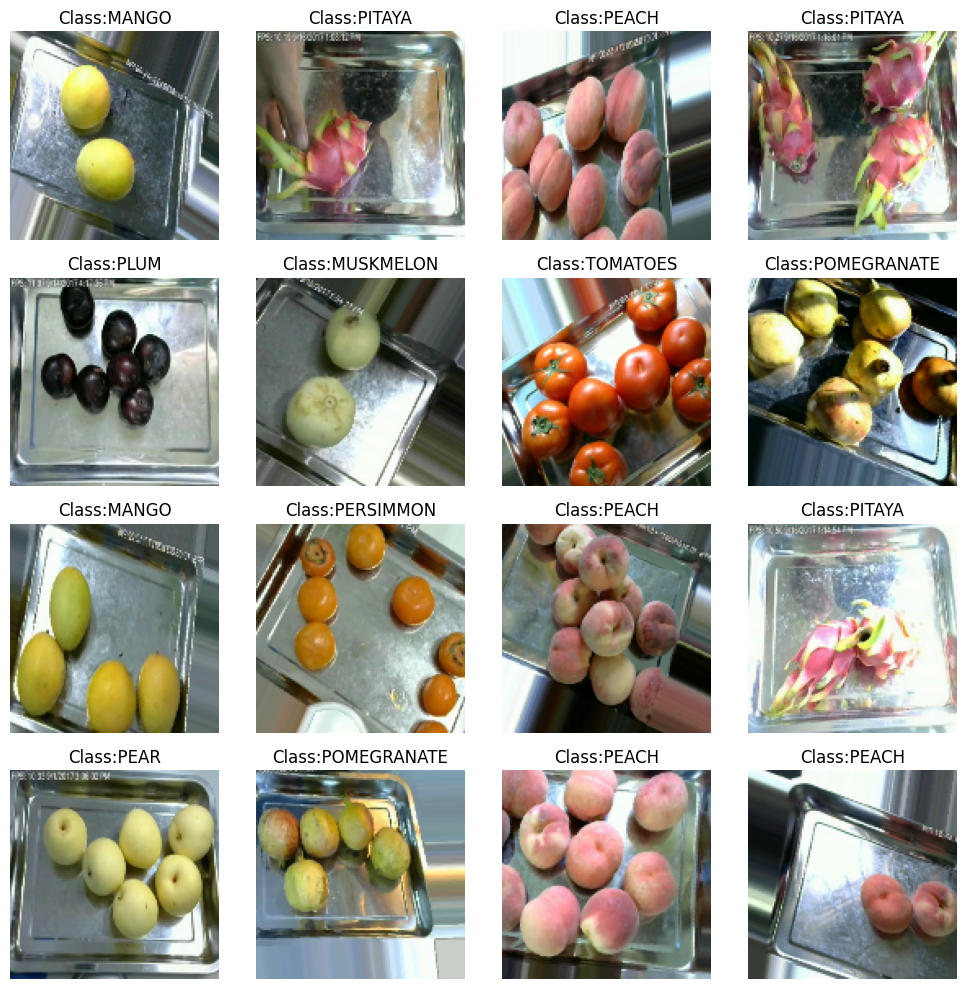

In [ ]:
show_images(data, labels, class_labels)

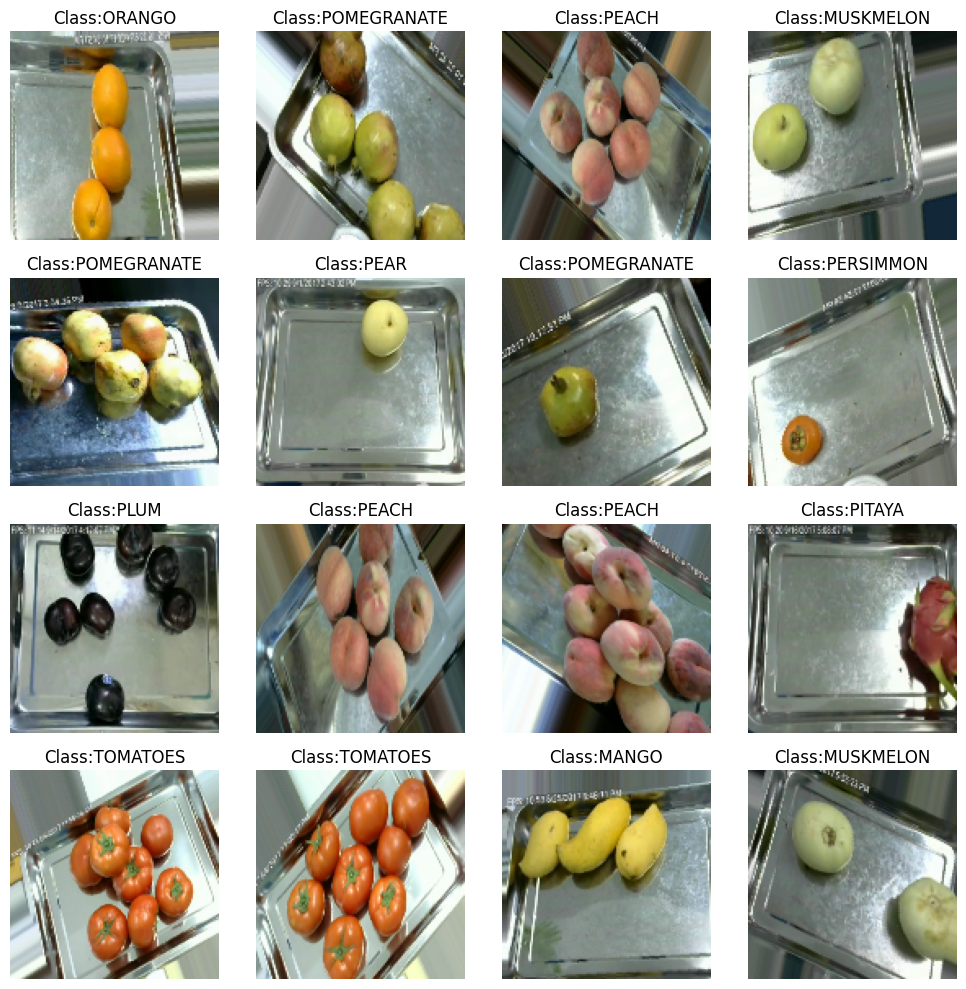

In [ ]:
show_images(data, labels, class_labels)

In [ ]:
!pip install scikit-learn  # Install scikit-learn if not already installed

from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split  # Import train_test_split

# ... (rest of your code) ...

y = to_categorical(labels)
X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=0.2, random_state=42, shuffle=True)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(2021, 128, 128, 3) (506, 128, 128, 3) (2021, 10) (506, 10)


In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, BatchNormalization, Dense, Dropout, Flatten

In [ ]:
cnn_model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.25),

    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.25),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D((2, 2)),
    Dropout(0.25),

    Flatten(),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

In [ ]:
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,307,338 (12.62 MB)

 Trainable params: 3,306,634 (12.61 MB)

 Non-trainable params: 704 (2.75 KB)

In [ ]:
history = cnn_model.fit(
    x=X_train,
    y=y_train,
    batch_size=64,
    epochs=1,
    validation_data=(X_test, y_test),
    shuffle=True
)

32/32 ━━━━━━━━━━━━━━━━━━━━ 133s 4s/step - accuracy: 0.5152 - loss: 1.6866 - val_accuracy: 0.0988 - val_loss: 5.0798


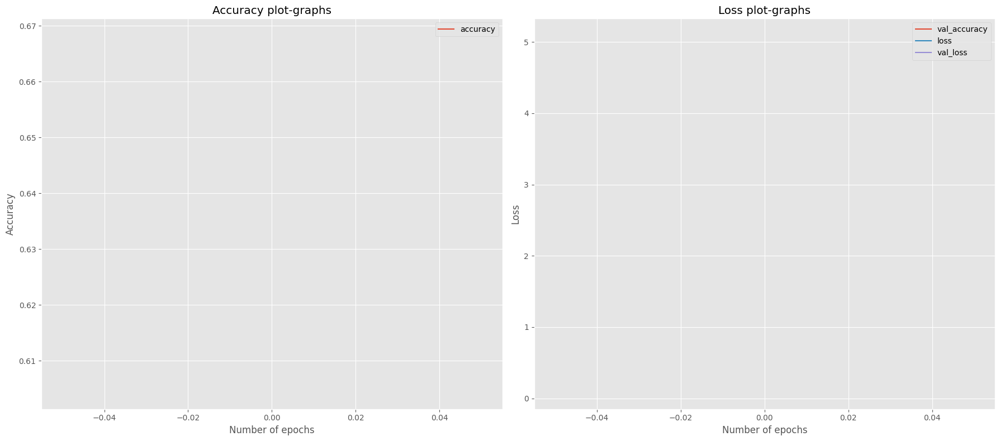

In [ ]:
with plt.style.context(style='ggplot'):
    fig,axes=plt.subplots(nrows=1,ncols=2,figsize=(18,8))
    axes[0].plot(history.history["accuracy"], label="accuracy")
    axes[1].plot(history.history["val_accuracy"], label="val_accuracy")
    axes[0].set_title(label='Accuracy plot-graphs')
    axes[0].set_xlabel('Number of epochs') # Changed: Provide xlabel as positional argument
    axes[0].set_ylabel('Accuracy') # Changed: Provide ylabel as positional argument
    axes[0].legend()
    axes[1].plot(history.history["loss"], label="loss")
    axes[1].plot(history.history["val_loss"],label="val_loss")
    axes[1].set_title(label='Loss plot-graphs')
    axes[1].set_xlabel('Number of epochs') # Changed: Provide xlabel as positional argument
    axes[1].set_ylabel('Loss') # Changed: Provide ylabel as positional argument
    axes[1].legend()
    fig.tight_layout()
    plt.show()

In [ ]:
cnn_prediction=cnn_model.predict(X_test, batch_size=32, verbose=1)

16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 314ms/step


In [ ]:
print(cnn_prediction)

[[4.2011398e-03 3.2119552e-04 4.2235134e-03 ... 9.1583687e-01
  5.7189056e-04 1.5552231e-06]
 [5.2066157e-03 5.9491850e-04 8.2461946e-03 ... 8.7917095e-01
  6.3663884e-04 3.4388415e-06]
 [4.0946570e-03 3.8851690e-04 4.3844003e-03 ... 9.0946054e-01
  3.1579391e-04 2.0697810e-06]
 ...
 [5.4945746e-03 6.7454379e-04 8.3552813e-03 ... 8.8212466e-01
  8.3478820e-04 3.1797922e-06]
 [6.3417307e-03 6.4816501e-04 7.4377959e-03 ... 8.5119003e-01
  7.7839539e-04 2.7977371e-06]
 [5.5210497e-03 7.6523743e-04 7.8587970e-03 ... 8.8080436e-01
  9.0693374e-04 4.7600342e-06]]


In [ ]:
cnn_labels=[]
for i in range(len(cnn_prediction)):
  cnn_labels.append(np.argmax(cnn_prediction[i]))

In [ ]:
print(cnn_labels)

[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 

In [ ]:
true_labels=[]
for i in range(len(y_test)):
  true_labels.append(np.argmax(y_test[i]))

In [ ]:
print(true_labels)

[7, 2, 0, 4, 4, 0, 8, 2, 5, 8, 6, 9, 2, 5, 6, 1, 4, 7, 9, 1, 6, 4, 0, 6, 1, 3, 8, 8, 9, 7, 4, 8, 4, 0, 1, 1, 1, 8, 0, 4, 5, 2, 6, 9, 3, 8, 8, 7, 3, 8, 5, 9, 7, 6, 9, 4, 9, 0, 4, 8, 9, 6, 3, 2, 8, 1, 0, 0, 2, 6, 6, 3, 4, 9, 0, 2, 9, 6, 7, 3, 7, 4, 7, 9, 5, 8, 1, 8, 8, 9, 3, 2, 8, 4, 8, 3, 1, 9, 1, 3, 1, 3, 2, 6, 1, 6, 7, 4, 7, 3, 1, 3, 4, 7, 0, 6, 1, 0, 4, 5, 3, 1, 7, 5, 5, 0, 9, 5, 7, 0, 5, 3, 3, 2, 2, 6, 5, 8, 1, 8, 7, 3, 8, 4, 3, 7, 3, 0, 6, 7, 9, 5, 9, 0, 6, 2, 5, 4, 0, 7, 9, 9, 2, 4, 7, 9, 0, 0, 7, 9, 9, 6, 5, 4, 6, 7, 8, 8, 7, 6, 9, 5, 1, 8, 5, 4, 0, 9, 3, 3, 7, 7, 7, 5, 2, 1, 8, 8, 8, 8, 2, 5, 0, 3, 8, 4, 6, 0, 2, 1, 8, 3, 4, 4, 6, 5, 0, 2, 7, 5, 5, 2, 2, 5, 1, 5, 4, 7, 2, 4, 7, 6, 5, 6, 2, 6, 5, 3, 1, 3, 8, 7, 6, 2, 0, 2, 4, 2, 3, 4, 4, 7, 9, 1, 3, 1, 9, 4, 9, 3, 9, 5, 1, 4, 9, 8, 9, 2, 5, 1, 0, 0, 2, 6, 3, 1, 7, 4, 9, 3, 2, 1, 4, 4, 6, 4, 7, 1, 8, 3, 2, 2, 9, 5, 4, 5, 3, 6, 4, 9, 0, 1, 1, 2, 6, 8, 0, 6, 4, 2, 8, 6, 3, 1, 0, 9, 4, 6, 2, 7, 3, 1, 4, 1, 6, 6, 0, 4, 4, 9, 4, 6, 8, 

In [ ]:
 cnn_accuracy=accuracy_score(y_true=true_labels,y_pred=cnn_labels)
print(f'Validation accuracy of Comvolutional Neural Network model is {cnn_accuracy*100.0:.2f}%')

Validation accuracy of Comvolutional Neural Network model is 9.88%


In [ ]:
print(classification_report(y_true=true_labels,y_pred=cnn_labels,target_names=class_labels))

              precision    recall  f1-score   support

       MANGO       0.00      0.00      0.00        46
    TOMATOES       0.00      0.00      0.00        53
       PEACH       0.00      0.00      0.00        49
      ORANGO       0.00      0.00      0.00        45
   PERSIMMON       0.00      0.00      0.00        57
   MUSKMELON       0.00      0.00      0.00        50
        PLUM       0.00      0.00      0.00        49
        PEAR       0.10      1.00      0.18        50
      PITAYA       0.00      0.00      0.00        54
 POMEGRANATE       0.00      0.00      0.00        53

    accuracy                           0.10       506
   macro avg       0.01      0.10      0.02       506
weighted avg       0.01      0.10      0.02       506



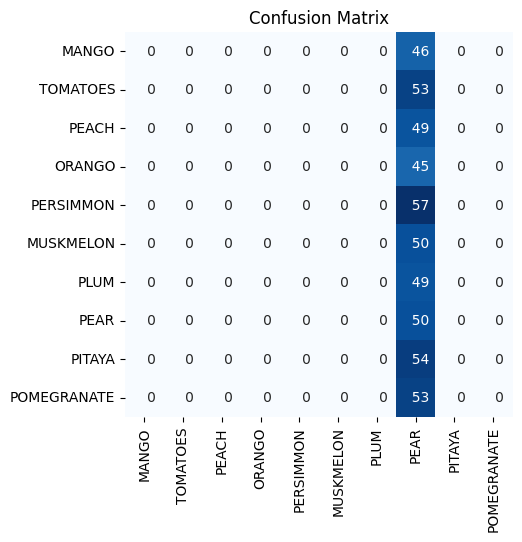

In [ ]:
plt.figure(figsize=(5,5))
sns.heatmap(data=confusion_matrix(y_true=true_labels,y_pred=cnn_labels), # Changed con_labels to cnn_labels
            annot=True,
            fmt='4d',
            cbar=False,
            cmap=plt.cm.Blues,
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title(label='Confusion Matrix')
plt.show()

In [ ]:
cnn_model.save(filepath="eswar.keras")

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras.utils import to_categorical


In [ ]:
base_dir='/content/drive/MyDrive/MINOR'
class_labels=os.listdir(base_dir)
class_labels.sort()
print(class_labels)

['MANGO', 'MUSKMELON', 'ORANGO', 'PEACH', 'PEAR', 'PERSIMMON', 'PITAYA', 'PLUM', 'POMEGRANATE', 'TOMATOES']


In [ ]:
data = []
labels = []
count = 0

for target in tqdm(class_labels):
    path = os.path.join(base_dir, target)
    image_names = os.listdir(path)
    for image_name in image_names:
        image_path = os.path.join(path, image_name)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (128, 128))
        image = np.array(image)
        image = image / 255.0
        data.append(image)
        labels.append(count)
    count += 1

100%|██████████| 10/10 [00:42<00:00,  4.29s/it]


In [ ]:
data = np.array(data)
labels = np.array(labels)

print(data.shape, labels.shape)

(2527, 128, 128, 3) (2527,)


In [ ]:
from random import randint

def show_images(X, y, class_names):
    Y = np.argmax(y, axis=1)
    plt.figure(figsize=(10, 10))
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        idx = randint(0, X.shape[0] - 1)
        plt.imshow(X[idx])
        plt.axis('off')
        plt.title("Class: {}".format(class_names[Y[idx]]))
    plt.tight_layout()
    plt.show()

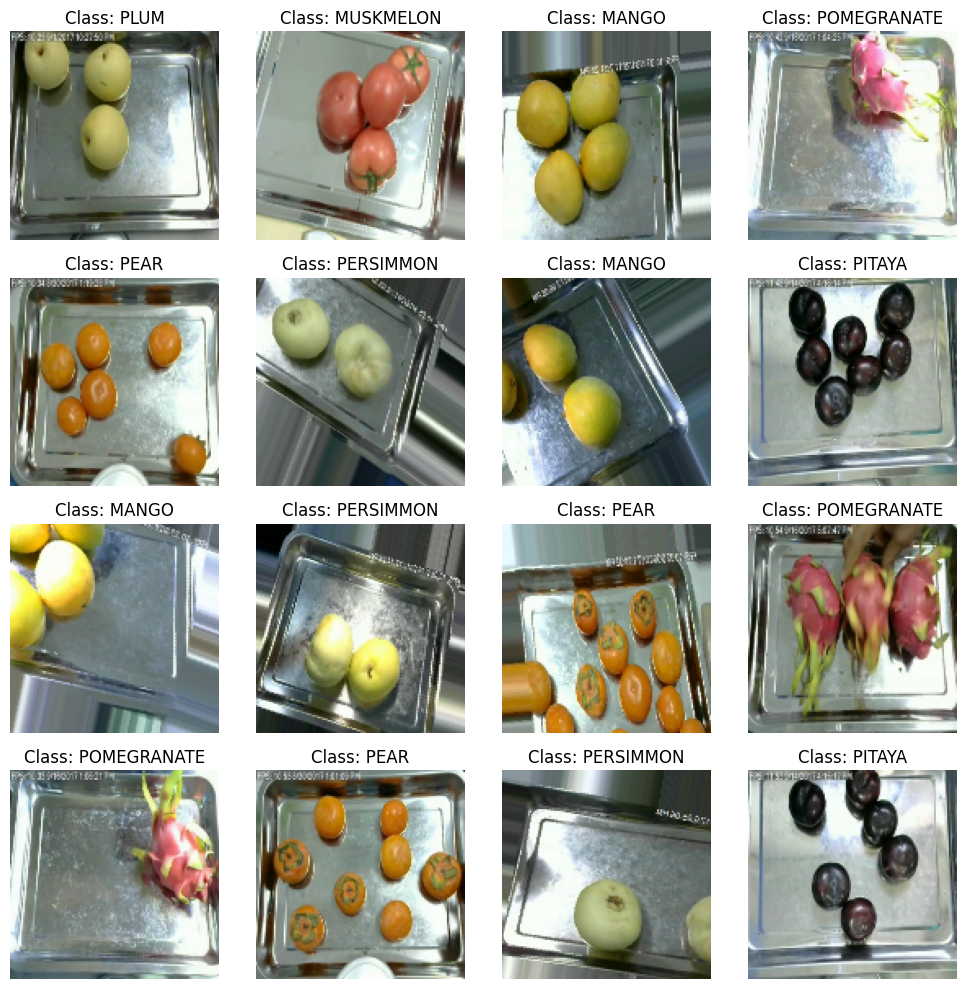

In [ ]:
show_images(X_train, y_train, class_labels)

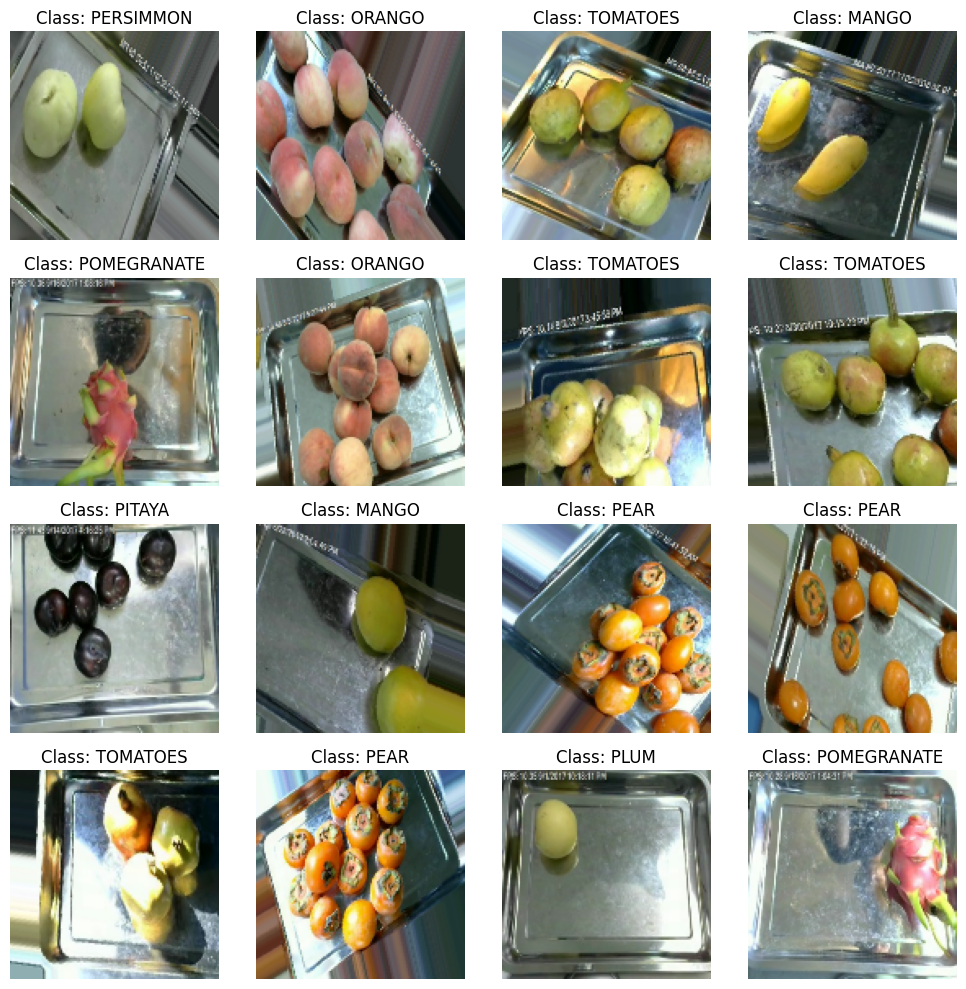

In [ ]:
show_images(X_test, y_test, class_labels)

In [ ]:
vgg_model = tf.keras.applications.VGG19(include_top=False,
                                       weights="imagenet",
                                       input_tensor=None,
                                       input_shape=(128, 128, 3),
                                       pooling="max",
                                       classes=1000)

vgg_model.trainable = False

inputs = vgg_model.input

m = tf.keras.layers.Dense(512, activation="relu")(vgg_model.output)
m = tf.keras.layers.Dropout(rate=0.5)(m)

outputs = tf.keras.layers.Dense(len(class_labels), activation="softmax")(m)

vgg_model = tf.keras.Model(inputs=inputs, outputs=outputs)

vgg_model.compile(optimizer="adam",
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])

vgg_model.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 20,292,170 (77.41 MB)

 Trainable params: 267,786 (1.02 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [ ]:
history = vgg_model.fit(X_train,y_train,batch_size=64,validation_data=(X_test,y_test),epochs=1)

32/32 ━━━━━━━━━━━━━━━━━━━━ 678s 21s/step - accuracy: 0.3322 - loss: 2.0329 - val_accuracy: 0.7549 - val_loss: 0.9109


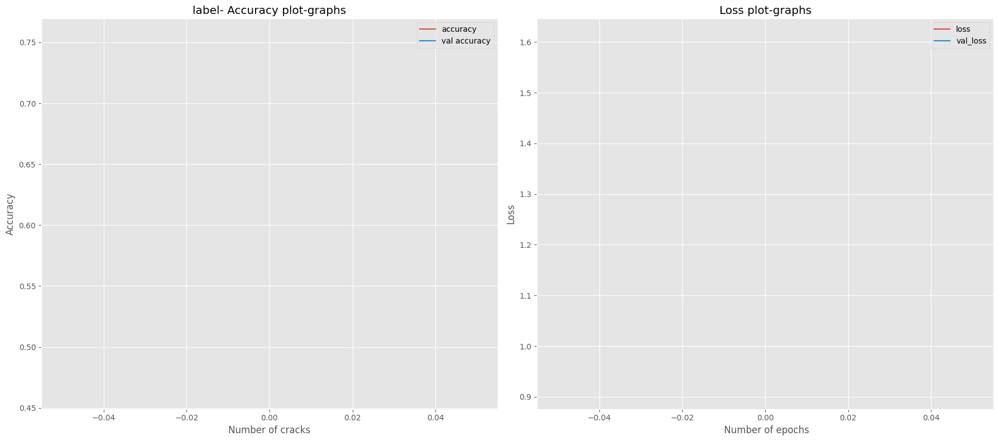

In [ ]:
with plt.style.context(style='ggplot'):
    # Changed '-' to '=' in the line below to correctly unpack the subplots.
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))
    axes[0].plot(history.history["accuracy"], label="accuracy") # Changed history to history.history
    axes[0].plot(history.history["val_accuracy"], label="val accuracy") # Changed history to history.history and label- to label=

    axes[0].set_title('label- Accuracy plot-graphs')
    axes[0].set_xlabel(xlabel='Number of cracks')
    axes[0].set_ylabel(ylabel='Accuracy')
    axes[0].legend()
    axes[1].plot(history.history["loss"], label='loss') # Changed history to history.history
    axes[1].plot(history.history["val_loss"], label="val_loss") # Changed history to history.history
    axes[1].set_title(label='Loss plot-graphs')
    axes[1].set_xlabel(xlabel=' Number of epochs')
    axes[1].set_ylabel(ylabel='Loss') # Fixed typo: 'Lass' to 'Loss'
    axes[1].legend()
    fig.tight_layout()
    plt.show()

In [ ]:
model_pred=vgg_model.predict(X_test, batch_size=32,verbose=1)

16/16 ━━━━━━━━━━━━━━━━━━━━ 131s 8s/step


In [ ]:
print(model_pred)

[[0.04196702 0.13794895 0.08290211 ... 0.30378005 0.0013569  0.19095097]
 [0.29226235 0.08461532 0.19143854 ... 0.00420757 0.00182217 0.14211372]
 [0.24579792 0.03529923 0.39951015 ... 0.00651924 0.00454762 0.15790175]
 ...
 [0.24380556 0.24379173 0.07983747 ... 0.005959   0.00135645 0.06773152]
 [0.19114958 0.11270858 0.06390171 ... 0.0017336  0.00256773 0.1176444 ]
 [0.12638485 0.06653424 0.03118588 ... 0.04531211 0.00727483 0.07829346]]


In [ ]:
model_labels=[]
for i in range(len(model_pred)):
  model_labels.append(np.argmax(model_pred[i]))

In [ ]:
print(model_labels)

[7, 0, 2, 4, 4, 0, 8, 0, 5, 8, 6, 9, 2, 0, 6, 0, 4, 7, 9, 3, 6, 4, 0, 6, 1, 3, 8, 8, 9, 7, 1, 8, 4, 9, 9, 1, 1, 8, 0, 4, 5, 2, 6, 9, 3, 8, 8, 7, 3, 8, 5, 0, 7, 6, 7, 4, 2, 0, 4, 8, 8, 6, 0, 1, 8, 4, 9, 0, 0, 6, 6, 3, 0, 0, 0, 2, 2, 6, 7, 3, 7, 4, 7, 1, 0, 8, 1, 8, 8, 0, 0, 2, 8, 4, 8, 9, 1, 9, 1, 0, 1, 7, 2, 6, 9, 6, 7, 2, 7, 0, 1, 3, 5, 7, 0, 6, 3, 0, 4, 5, 3, 1, 7, 0, 5, 0, 9, 5, 7, 0, 5, 1, 0, 2, 5, 6, 5, 8, 0, 8, 7, 0, 8, 9, 3, 7, 3, 0, 6, 7, 9, 5, 9, 0, 6, 2, 3, 4, 0, 7, 8, 9, 5, 4, 7, 9, 0, 9, 7, 9, 9, 6, 0, 4, 6, 7, 8, 8, 7, 6, 9, 0, 3, 8, 5, 2, 9, 5, 0, 0, 7, 7, 7, 0, 9, 1, 8, 8, 8, 8, 2, 5, 0, 3, 8, 4, 6, 0, 2, 1, 8, 3, 4, 4, 6, 0, 0, 2, 7, 5, 5, 0, 0, 5, 1, 5, 5, 7, 5, 4, 7, 6, 5, 6, 2, 6, 5, 0, 1, 3, 8, 7, 6, 9, 0, 2, 4, 9, 3, 4, 1, 7, 9, 1, 3, 3, 9, 4, 4, 3, 9, 0, 1, 4, 9, 8, 2, 2, 5, 1, 0, 0, 2, 6, 0, 3, 7, 4, 9, 3, 2, 1, 4, 4, 6, 4, 7, 1, 8, 3, 2, 2, 9, 5, 4, 5, 3, 6, 4, 9, 0, 1, 1, 2, 6, 8, 2, 6, 4, 5, 8, 6, 3, 2, 0, 9, 4, 6, 2, 7, 3, 1, 2, 1, 6, 6, 0, 4, 4, 1, 1, 6, 8, 

In [ ]:
true_labels=[]
for i in range(len(y_test)):
  true_labels.append(np.argmax(y_test[i]))

In [ ]:
print(true_labels)

[7, 2, 0, 4, 4, 0, 8, 2, 5, 8, 6, 9, 2, 5, 6, 1, 4, 7, 9, 1, 6, 4, 0, 6, 1, 3, 8, 8, 9, 7, 4, 8, 4, 0, 1, 1, 1, 8, 0, 4, 5, 2, 6, 9, 3, 8, 8, 7, 3, 8, 5, 9, 7, 6, 9, 4, 9, 0, 4, 8, 9, 6, 3, 2, 8, 1, 0, 0, 2, 6, 6, 3, 4, 9, 0, 2, 9, 6, 7, 3, 7, 4, 7, 9, 5, 8, 1, 8, 8, 9, 3, 2, 8, 4, 8, 3, 1, 9, 1, 3, 1, 3, 2, 6, 1, 6, 7, 4, 7, 3, 1, 3, 4, 7, 0, 6, 1, 0, 4, 5, 3, 1, 7, 5, 5, 0, 9, 5, 7, 0, 5, 3, 3, 2, 2, 6, 5, 8, 1, 8, 7, 3, 8, 4, 3, 7, 3, 0, 6, 7, 9, 5, 9, 0, 6, 2, 5, 4, 0, 7, 9, 9, 2, 4, 7, 9, 0, 0, 7, 9, 9, 6, 5, 4, 6, 7, 8, 8, 7, 6, 9, 5, 1, 8, 5, 4, 0, 9, 3, 3, 7, 7, 7, 5, 2, 1, 8, 8, 8, 8, 2, 5, 0, 3, 8, 4, 6, 0, 2, 1, 8, 3, 4, 4, 6, 5, 0, 2, 7, 5, 5, 2, 2, 5, 1, 5, 4, 7, 2, 4, 7, 6, 5, 6, 2, 6, 5, 3, 1, 3, 8, 7, 6, 2, 0, 2, 4, 2, 3, 4, 4, 7, 9, 1, 3, 1, 9, 4, 9, 3, 9, 5, 1, 4, 9, 8, 9, 2, 5, 1, 0, 0, 2, 6, 3, 1, 7, 4, 9, 3, 2, 1, 4, 4, 6, 4, 7, 1, 8, 3, 2, 2, 9, 5, 4, 5, 3, 6, 4, 9, 0, 1, 1, 2, 6, 8, 0, 6, 4, 2, 8, 6, 3, 1, 0, 9, 4, 6, 2, 7, 3, 1, 4, 1, 6, 6, 0, 4, 4, 9, 4, 6, 8, 

In [ ]:
model_accuracy=accuracy_score (y_true=true_labels, y_pred=model_labels)
print(f"Validation accuracy of VGG19 model accuracy is {model_accuracy * 100:.2f}%")


Validation accuracy of VGG19 model accuracy is 75.49%


In [ ]:
from IPython.core.display import display, HTML
display (HTML("<h1>VGG19 model classification report"))
print(classification_report (y_true=true_labels, y_pred=model_labels, target_names=class_labels))

              precision    recall  f1-score   support

       MANGO       0.39      0.63      0.48        46
   MUSKMELON       0.80      0.68      0.73        53
      ORANGO       0.73      0.61      0.67        49
       PEACH       0.73      0.60      0.66        45
        PEAR       0.93      0.70      0.80        57
   PERSIMMON       0.64      0.74      0.69        50
      PITAYA       1.00      1.00      1.00        49
        PLUM       0.94      1.00      0.97        50
 POMEGRANATE       0.95      1.00      0.97        54
    TOMATOES       0.61      0.57      0.59        53

    accuracy                           0.75       506
   macro avg       0.77      0.75      0.76       506
weighted avg       0.78      0.75      0.76       506



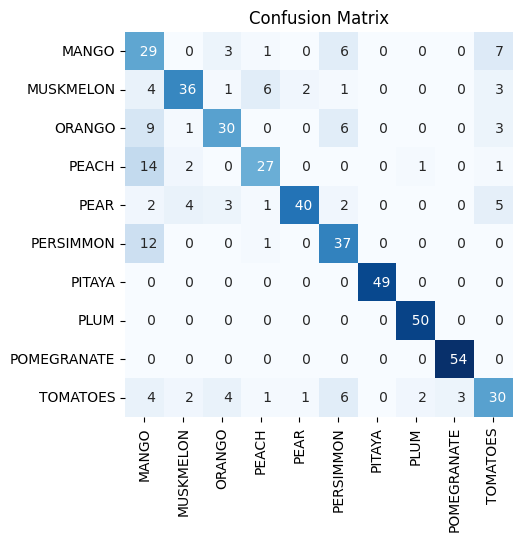

In [ ]:
plt.figure(figsize=(5,5))
sns.heatmap(data=confusion_matrix(y_true=true_labels, y_pred=model_labels),
            annot=True,
            fmt='4d',
            cbar=False,
            cmap=plt.cm.Blues,
            xticklabels=class_labels,
            yticklabels=class_labels
)
plt.title(label='Confusion Matrix')
plt.show()

In [ ]:
vgg_model.save(filepath="eswar.keras")

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import os
import cv2

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import tensorflow as tf
from tensorflow.keras.utils import to_categorical

In [ ]:
base_dir = '/content/drive/MyDrive/MINOR'
class_labels = os.listdir(base_dir)
class_labels.sort()
print(class_labels)


['MANGO', 'MUSKMELON', 'ORANGO', 'PEACH', 'PEAR', 'PERSIMMON', 'PITAYA', 'PLUM', 'POMEGRANATE', 'TOMATOES']


In [ ]:
chart_data = []
for target in class_labels:
    path = os.path.join(base_dir, target)
    size = len(os.listdir(path))
    chart_data.append(size)
    print(f'The target ({target}) has ({size}) samples in the dataset')

The target (MANGO) has (250) samples in the dataset
The target (MUSKMELON) has (248) samples in the dataset
The target (ORANGO) has (250) samples in the dataset
The target (PEACH) has (251) samples in the dataset
The target (PEAR) has (250) samples in the dataset
The target (PERSIMMON) has (250) samples in the dataset
The target (PITAYA) has (265) samples in the dataset
The target (PLUM) has (250) samples in the dataset
The target (POMEGRANATE) has (261) samples in the dataset
The target (TOMATOES) has (252) samples in the dataset


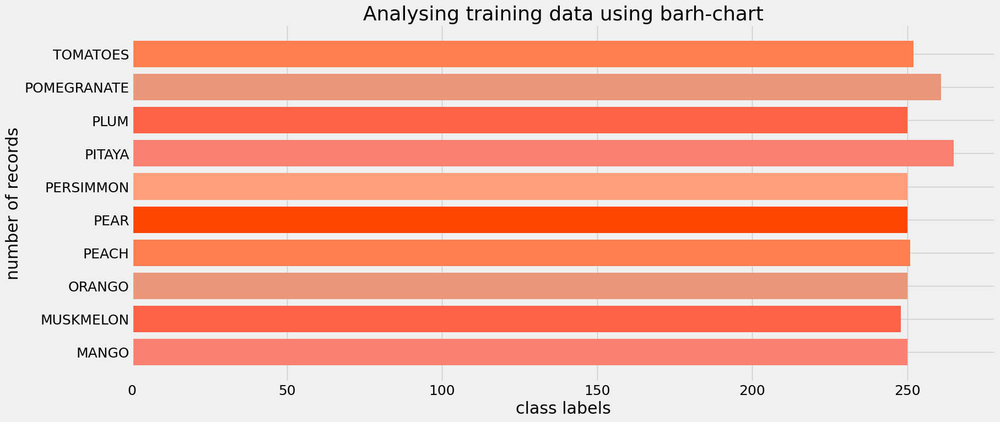

In [ ]:
with plt.style.context(style="fivethirtyeight"):
    plt.figure(figsize=(18, 8))

    plt.rcParams["font.size"] = 18
    plt.barh(y=class_labels,
             width=chart_data,
             color=["salmon", "tomato", "darksalmon", "coral", "orangered", "lightsalmon"])

    plt.title(label="Analysing training data using barh-chart")
    plt.xlabel(xlabel="class labels")
    plt.ylabel(ylabel="number of records")
    plt.show()

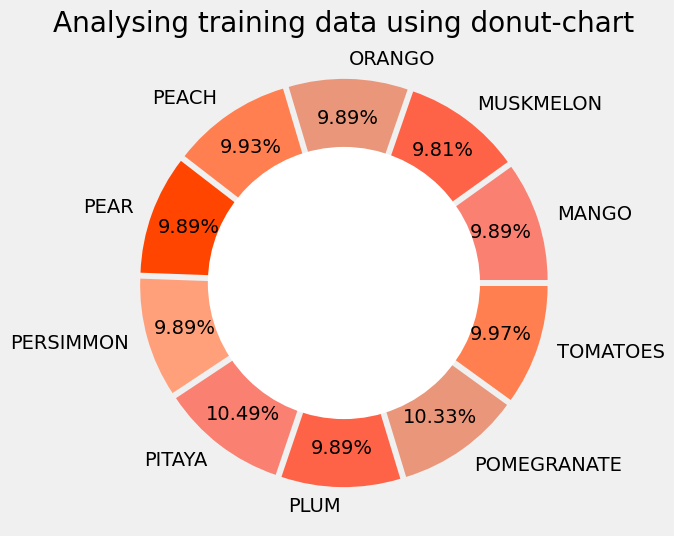

In [ ]:
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(6, 6))
    plt.pie(x=chart_data,
        colors=["salmon", "tomato", "darksalmon", "coral", "orangered", "lightsalmon"],
        labels=class_labels,
        autopct="%1.2f%%",
        pctdistance=0.80,
        # The following line ensures 'explode' has the same length as 'chart_data'
        explode=[0.05] * len(chart_data),
    )
    centre_circle = plt.Circle((0, 0), 0.70, fc="white")
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.title(label="Analysing training data using donut-chart")
    plt.show()

In [ ]:
# Initialize empty lists to store images and labels
data = []
labels = []

# Initialize a counter to assign unique labels to each image
count = 0

# Iterate over each target class in the class_labels list
for target in tqdm(class_labels):
    # Construct the path to the target class directory
    path = os.path.join(base_dir, target)

    # Get a list of image filenames within the target directory
    image_names = os.listdir(path)

    # Iterate over each image in the target class
    for image_name in image_names:
        # Construct the full path to the image file
        image_path = os.path.join(path, image_name)

        # Read the image using OpenCV, convert it to RGB color space, and resize it to 128x128 pixels
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (128, 128))

        # Convert the image to a NumPy array and normalize it to the range [0, 1]
        image = np.array(image)
        image = image / 255.0

        # Append the image and its corresponding label to the lists
        data.append(image)
        labels.append(count)

    # Increment the counter for the next target class
    count += 1


100%|██████████| 10/10 [00:37<00:00,  3.70s/it]


In [ ]:
# Convert the data and labels lists to NumPy arrays
data = np.array(data)
labels = np.array(labels)

# Print the shapes of the data and labels arrays
print(data.shape, labels.shape)

(2527, 128, 128, 3) (2527,)


In [ ]:
from random import randint

def show_images(X, y, class_names):
    plt.figure(figsize=(10, 10))
    for i in range(16):
        ax = plt.subplot(4, 4, i+1)
        idx = randint(0, X.shape[0]-1)
        plt.imshow(X[idx])
        plt.axis('off')
        plt.title("Class:{}".format(class_names[y[idx]]))
    plt.tight_layout()
    plt.show()

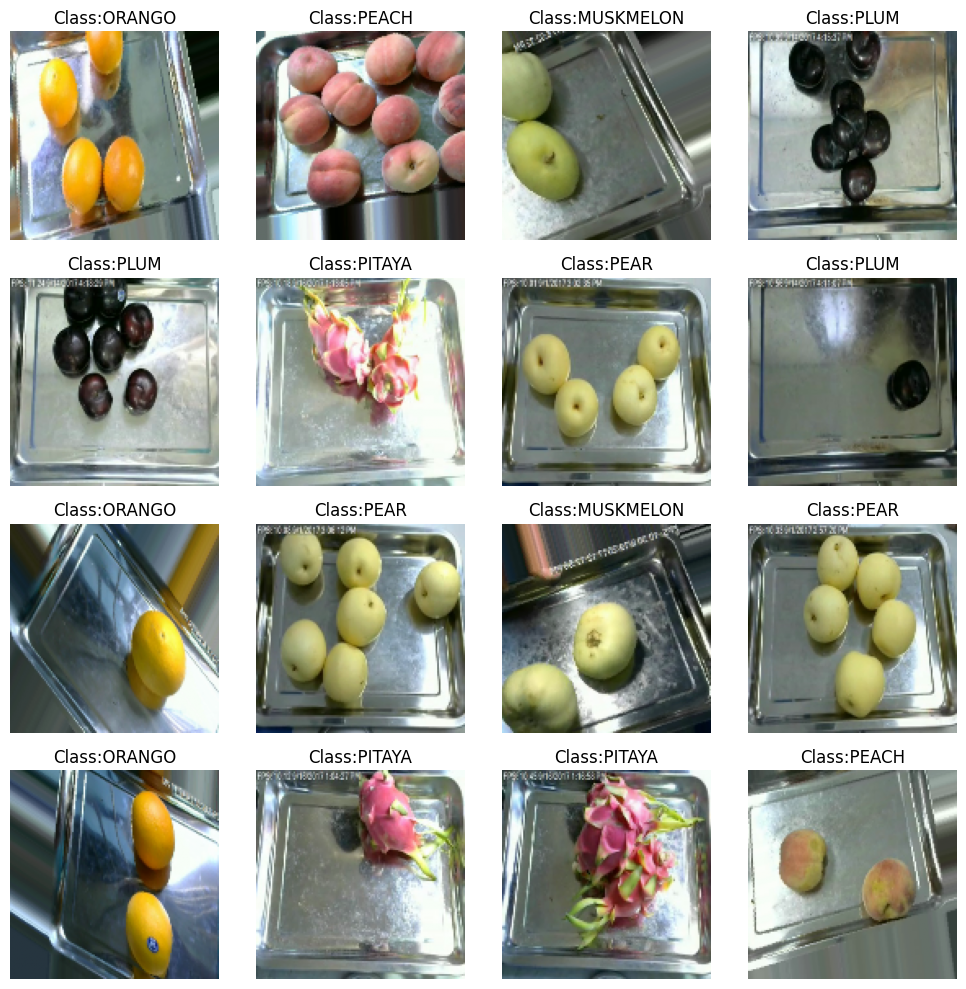

In [ ]:
show_images(data, labels, class_labels)


In [ ]:
# Convert labels to categorical format
y = to_categorical(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=0.2, random_state=42, shuffle=True)

# Print the shapes of the training and testing sets
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)


(2021, 128, 128, 3) (506, 128, 128, 3) (2021, 10) (506, 10)


In [ ]:
# Load the pre-trained DenseNet201 model
densenet_model = tf.keras.applications.DenseNet201(include_top=False,
                                                  weights='imagenet',
                                                  input_tensor=None,
                                                  input_shape=(128, 128, 3),
                                                  pooling='max',
                                                  classes=1000)

# Freeze the weights of the pre-trained model
densenet_model.trainable = False

74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Create a new input layer for the dense model
inputs = densenet_model.input

# Add a dense layer with 512 units and ReLU activation to the output of DenseNet201
m = tf.keras.layers.Dense(512, activation='relu')(densenet_model.output)

# Add an output layer with softmax activation to predict the class probabilities
outputs = tf.keras.layers.Dense(len(class_labels), activation='softmax')(m)

# Create the final model with the input layer and the output layer
dense_model = tf.keras.Model(inputs=inputs, outputs=outputs)


In [ ]:
# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
dense_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
# Print the model summary to see the architecture and parameters
dense_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 134, 134, 3)    │              0 │ input_layer_2[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 64, 64, 64)     │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 64, 64, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 64, 64, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 66, 66, 64)     │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 32, 32, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 32, 32, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 32, 32, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 32, 32, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 32, 32, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 32, 32, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 32, 32, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 32, 32, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 19,310,666 (73.66 MB)

 Trainable params: 988,682 (3.77 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [ ]:
# Train the model with the given training data, validation data, batch size, and epochs
history = dense_model.fit(X_train, y_train, batch_size=16, validation_data=(X_test, y_test), epochs=2)

Epoch 1/2
127/127 ━━━━━━━━━━━━━━━━━━━━ 238s 2s/step - accuracy: 0.6704 - loss: 2.4816 - val_accuracy: 0.9269 - val_loss: 0.2035
Epoch 2/2
127/127 ━━━━━━━━━━━━━━━━━━━━ 255s 2s/step - accuracy: 0.9786 - loss: 0.0577 - val_accuracy: 0.9881 - val_loss: 0.0500


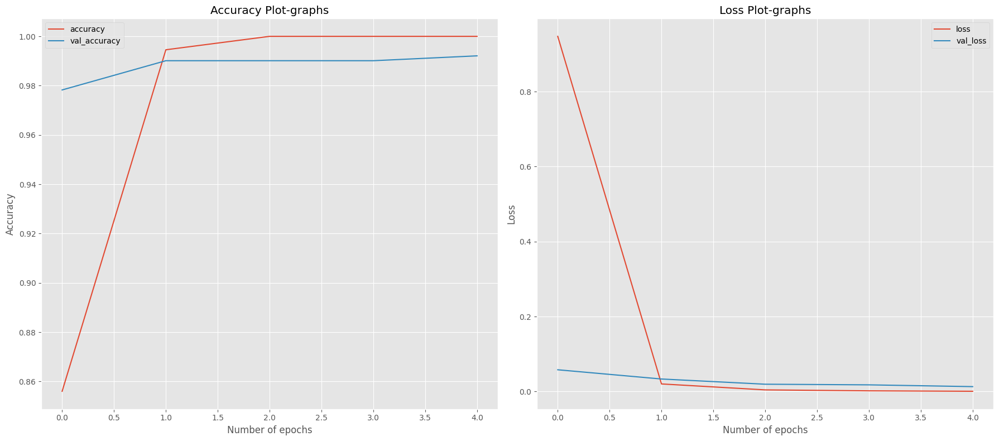

In [ ]:
with plt.style.context(style='ggplot'):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

    axes[0].plot(history.history['accuracy'], label='accuracy')
    axes[0].plot(history.history['val_accuracy'], label='val_accuracy')
    axes[0].set_title('Accuracy Plot-graphs')
    axes[0].set_xlabel('Number of epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()

    axes[1].plot(history.history['loss'], label='loss')
    axes[1].plot(history.history['val_loss'], label='val_loss')
    axes[1].set_title('Loss Plot-graphs')
    axes[1].set_xlabel('Number of epochs')
    axes[1].set_ylabel('Loss')
    axes[1].legend()

    fig.tight_layout()
    plt.show()

In [ ]:
dense_model_prediction = dense_model.predict(X_test, batch_size=32, verbose=1)

16/16 ━━━━━━━━━━━━━━━━━━━━ 60s 3s/step


In [ ]:
print(dense_model_prediction)

[[4.79947333e-15 1.97927352e-11 5.80690981e-11 ... 1.73632742e-09
  1.33417125e-05 1.94207050e-09]
 [6.63799105e-09 3.05824096e-06 1.08236486e-08 ... 1.60410374e-09
  2.09621224e-03 1.93391223e-08]
 [9.71206963e-01 1.18266269e-06 2.66018212e-02 ... 1.03479742e-11
  2.17572274e-03 5.36046763e-08]
 ...
 [4.19650110e-04 9.99344885e-01 1.02227408e-04 ... 4.97320241e-11
  1.24338214e-04 1.58479494e-07]
 [7.00394094e-06 9.07467154e-04 2.14649208e-06 ... 1.42769824e-12
  2.65543775e-07 5.52396406e-10]
 [4.52040922e-12 5.74593255e-11 2.85775718e-06 ... 2.92500191e-10
  1.95261709e-05 2.61018067e-05]]


In [ ]:
dense_model_pred = []
for i in range(len(dense_model_prediction)):
    dense_model_pred.append(np.argmax(dense_model_prediction[i]))



In [ ]:
print(dense_model_pred)

[6, 3, 0, 4, 4, 0, 8, 2, 5, 8, 6, 9, 2, 5, 6, 1, 4, 7, 9, 1, 6, 4, 0, 6, 2, 3, 8, 8, 9, 7, 4, 8, 4, 0, 1, 1, 1, 8, 0, 4, 2, 2, 6, 9, 3, 8, 8, 7, 3, 8, 5, 9, 7, 6, 9, 4, 9, 0, 4, 8, 9, 6, 3, 2, 8, 0, 0, 0, 2, 6, 6, 3, 4, 9, 0, 2, 9, 6, 7, 3, 7, 4, 7, 9, 5, 7, 1, 8, 8, 9, 3, 2, 8, 4, 8, 3, 1, 9, 1, 3, 1, 3, 2, 6, 1, 6, 7, 4, 7, 3, 1, 3, 4, 7, 0, 6, 1, 0, 4, 6, 3, 1, 7, 5, 5, 0, 9, 5, 6, 0, 5, 3, 3, 2, 2, 6, 5, 8, 1, 8, 7, 3, 8, 4, 3, 7, 3, 0, 6, 7, 9, 5, 9, 0, 6, 2, 5, 4, 0, 7, 9, 9, 2, 4, 7, 9, 0, 0, 7, 9, 9, 6, 5, 4, 6, 7, 8, 8, 7, 6, 9, 5, 1, 8, 5, 4, 0, 9, 3, 3, 7, 7, 7, 5, 2, 1, 8, 8, 8, 8, 2, 5, 0, 8, 8, 4, 6, 0, 2, 1, 8, 3, 4, 4, 6, 5, 0, 2, 7, 5, 5, 2, 2, 8, 1, 5, 4, 7, 2, 4, 7, 6, 5, 6, 2, 6, 5, 3, 1, 3, 8, 7, 6, 2, 0, 2, 4, 2, 3, 4, 4, 7, 9, 1, 3, 1, 9, 4, 9, 3, 9, 5, 1, 4, 9, 8, 9, 2, 5, 1, 0, 0, 2, 6, 3, 1, 7, 4, 8, 3, 2, 1, 4, 4, 6, 4, 7, 1, 7, 3, 2, 2, 9, 5, 4, 5, 3, 6, 4, 9, 0, 1, 1, 2, 6, 8, 0, 6, 4, 2, 7, 6, 3, 1, 0, 9, 4, 6, 2, 7, 3, 1, 4, 1, 6, 6, 0, 4, 4, 9, 4, 6, 8, 

In [ ]:
true_labels = []
for i in range(len(y_test)): true_labels.append(np.argmax(y_test[i]))


In [ ]:
print(true_labels)

[6, 3, 0, 4, 4, 0, 8, 2, 5, 8, 6, 9, 2, 5, 6, 1, 4, 7, 9, 1, 6, 4, 0, 6, 2, 3, 8, 8, 9, 7, 4, 8, 4, 0, 1, 1, 1, 8, 0, 4, 5, 2, 6, 9, 3, 8, 8, 7, 3, 8, 5, 9, 7, 6, 9, 4, 9, 0, 4, 8, 9, 6, 3, 2, 8, 1, 0, 0, 2, 6, 6, 3, 4, 9, 0, 2, 9, 6, 7, 3, 7, 4, 7, 9, 5, 7, 1, 8, 8, 9, 3, 2, 8, 4, 8, 3, 1, 9, 1, 3, 1, 3, 2, 6, 1, 6, 7, 4, 7, 3, 1, 3, 4, 7, 0, 6, 1, 0, 4, 6, 3, 1, 7, 5, 5, 0, 9, 5, 6, 0, 5, 3, 3, 2, 2, 6, 5, 8, 1, 8, 7, 3, 8, 4, 3, 7, 3, 0, 6, 7, 9, 5, 9, 0, 6, 2, 5, 4, 0, 7, 9, 9, 2, 4, 7, 9, 0, 0, 7, 9, 9, 6, 5, 4, 6, 7, 8, 8, 7, 6, 9, 5, 1, 8, 5, 4, 0, 9, 3, 3, 7, 7, 7, 5, 2, 1, 8, 8, 8, 8, 2, 5, 0, 3, 8, 4, 6, 0, 2, 1, 8, 3, 4, 4, 6, 5, 0, 2, 7, 5, 5, 2, 2, 5, 1, 5, 4, 7, 2, 4, 7, 6, 5, 6, 2, 6, 5, 3, 1, 3, 8, 7, 6, 2, 0, 2, 4, 2, 3, 4, 4, 7, 9, 1, 3, 1, 9, 4, 9, 3, 9, 5, 1, 4, 9, 8, 9, 2, 5, 1, 0, 0, 2, 6, 3, 1, 7, 4, 8, 3, 2, 1, 4, 4, 6, 4, 7, 1, 7, 3, 2, 2, 9, 5, 4, 5, 3, 6, 4, 9, 0, 1, 1, 2, 6, 8, 0, 6, 4, 2, 7, 6, 3, 1, 0, 9, 4, 6, 2, 7, 3, 1, 4, 1, 6, 6, 0, 4, 4, 9, 4, 6, 8, 

In [ ]:
densemodel_accuracy = accuracy_score(y_true=true_labels, y_pred=dense_model_pred)
print(f"Validation accuracy of DenseNet201 model accuracy is {densemodel_accuracy*100:.2f}%")

Validation accuracy of DenseNet201 model accuracy is 98.81%


In [ ]:
from IPython.core.display import display, HTML

display(HTML("<h1>DenseNet 201 model classification report</h1>"))

print(classification_report(y_true=true_labels, y_pred=dense_model_pred, target_names=class_labels))

              precision    recall  f1-score   support

       MANGO       0.98      1.00      0.99        46
   MUSKMELON       1.00      0.96      0.98        52
      ORANGO       0.96      1.00      0.98        49
       PEACH       1.00      0.98      0.99        46
        PEAR       1.00      1.00      1.00        57
   PERSIMMON       1.00      0.96      0.98        49
      PITAYA       1.00      1.00      1.00        53
        PLUM       1.00      1.00      1.00        51
 POMEGRANATE       0.95      1.00      0.97        52
    TOMATOES       1.00      0.98      0.99        51

    accuracy                           0.99       506
   macro avg       0.99      0.99      0.99       506
weighted avg       0.99      0.99      0.99       506



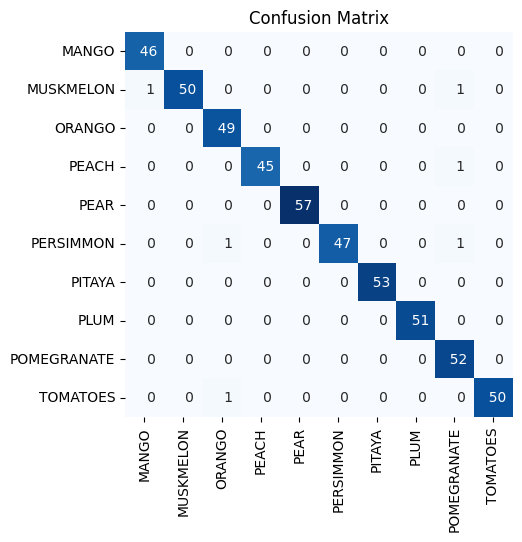

In [ ]:
plt.figure(figsize=(5,5))
sns.heatmap(data=confusion_matrix(y_true=true_labels, y_pred=dense_model_pred),
            annot=True,
            fmt='4d',
            cbar=False,
            cmap=plt.cm.Blues,
            xticklabels=class_labels,
            yticklabels=class_labels)

plt.title(label='Confusion Matrix')
plt.show()

In [ ]:
dense_model.save(filepath="eswar.keras")

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Image, display
from tensorflow.keras.models import load_model

for dirname, _, filenames in os.walk("models"):
    for filename in filenames:
        print(os.path.join(dirname, filename))

models/Convolutional Neural Network_model.h5


In [ ]:
# Load the saved DenseNet201 model
from tensorflow.keras.models import load_model # Import the load_model function
model = load_model(filepath='eswar.keras', compile=False)

# Compile the model with Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Define the class labels
class_labels = ['MANGO', 'MUSKMELON', 'ORANGO', 'PEACH', 'PEAR', 'PERSIMMON', 'PITAYA', 'PLUM', 'POMEGRANATE', 'TOMATOES']

In [ ]:
image_path = '/content/drive/MyDrive/MINOR/TOMATOES/Tamotoes001.png'


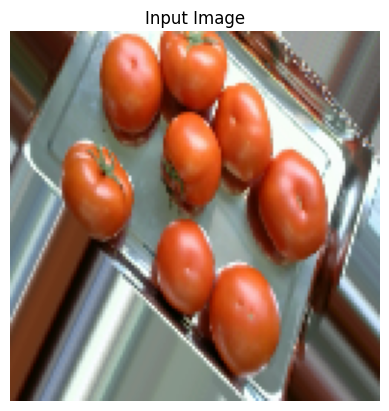

In [ ]:
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (128, 128))
plt.imshow(image)
plt.title(label='Input Image')
plt.axis('off')
plt.show()

In [ ]:
# Convert the image to a NumPy array
image = np.array(image)

# Normalize the pixel values to the range [0, 1]
image = image / 255.0

# Add a new dimension to the image array to make it compatible with the model input shape
image = np.expand_dims(image, axis=0)

# Print the shape of the preprocessed image array
print(image.shape)

(1, 128, 128, 3)


In [ ]:
# Make a prediction on the preprocessed image
model_prediction = model.predict(image)

# Get the predicted class index
model_class = np.argmax(model_prediction[0])

# Get the predicted class label
model_label = class_labels[model_class]

# Extract the fruit name and quality from the predicted label
# Check if the label contains an underscore before splitting
if "_" in model_label:
    fruit_name = model_label.split("_")[0]
    fruit_quality = model_label.split("_")[1]
else:
    fruit_name = model_label
    fruit_quality = "good"  # Or any default value you prefer

# Print the predicted fruit name and quality
print(f"Fruit classified as -> {fruit_name}")
print(f"Quality assessed as -> {fruit_quality}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
Fruit classified as -> TOMATOES
Quality assessed as -> good


In [ ]:
!pip install gradio


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.1/320.1 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.8/63.8 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 10.9 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2


In [ ]:
def preprocess_image(image):
    try:
        # Ensure consistent resizing
        image = image.resize((224, 224))  # Adjust size as per your model
        image_array = np.array(image) / 255.0  # Normalize pixel values
        if image_array.ndim == 2:  # If grayscale, convert to RGB
            image_array = np.stack([image_array] * 3, axis=-1)
        return np.expand_dims(image_array, axis=0)  # Add batch dimension
    except Exception as e:
        raise ValueError(f"Error in preprocessing image: {str(e)}")


In [ ]:
print("Model input shape:", model.input_shape)
print("Model output shape:", model.output_shape)


Model input shape: (None, 128, 128, 3)
Model output shape: (None, 10)


In [ ]:
def predict_fruit_quality(image):
    try:
        processed_image = preprocess_image(image)
        prediction = model.predict(processed_image)
        quality = "Good" if prediction[0] > 0.5 else "Bad"
        return f"The fruit is {quality} quality."
    except Exception as e:
        return f"Error: {str(e)}"


In [ ]:
def predict_fruit_quality(image):
    print("Uploaded image type:", type(image))
    processed_image = preprocess_image(image)
    prediction = model.predict(processed_image)
    quality = "Good" if prediction[0] > 0.5 else "Bad"
    return f"The fruit is {quality} quality."


In [ ]:
!pip install gradio --upgrade # Install gradio or upgrade existing installation

In [ ]:
def preprocess_image(image):
    try:
        # Resize the image to the model's expected input size
        image = image.resize((128, 128))  # Change to 128x128
        image_array = np.array(image) / 255.0  # Normalize pixel values (0 to 1)

        # Handle grayscale images by converting them to RGB
        if image_array.ndim == 2:
            image_array = np.stack([image_array] * 3, axis=-1)

        return np.expand_dims(image_array, axis=0)  # Add batch dimension
    except Exception as e:
        raise ValueError(f"Error in preprocessing image: {str(e)}")


In [ ]:
!pip install gradio --upgrade # Installs or upgrades gradio

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
from PIL import Image
!pip install gradio --upgrade # Installs or upgrades gradio
import gradio as gr # Import gradio after installation or upgrade


# Load your model
model = load_model('eswar.keras')


# Updated preprocessing function
def preprocess_image(image):
    try:
        # Resize the image to the expected input size of the model
        image = image.resize((128, 128))  # Update dimensions to (128, 128)
        image_array = np.array(image) / 255.0  # Normalize pixel values to [0, 1]

        # Handle grayscale images by converting to RGB
        if image_array.ndim == 2:  # If grayscale, stack into RGB format
            image_array = np.stack([image_array] * 3, axis=-1)

        return np.expand_dims(image_array, axis=0)  # Add batch dimension
    except Exception as e:
        raise ValueError(f"Error in preprocessing image: {str(e)}")

# Prediction function
def predict_fruit_quality(image):
    try:
        # Preprocess the image
        processed_image = preprocess_image(image)

        # Make predictions
        prediction = model.predict(processed_image)
        quality = "Good" if prediction[0] > 0.5 else "Bad"

        return f"The fruit is {quality} quality."
    except Exception as e:
        return f"Error: {str(e)}"

# Gradio interface
# Changed gr.inputs.Image to gr.Image
interface = gr.Interface(
    fn=predict_fruit_quality,
    inputs=gr.Image(type="pil"),  # Expect image input
    outputs="text",                      # Return text output
    title="Fruit Quality Detector",
    description="Upload an image of a fruit to check its quality."
)

# Launch the Gradio app
interface.launch()

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://312cfecea9393426cd.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
!pip install flask flask-ngrok

# Import required libraries
from flask import Flask, request, jsonify
from flask_ngrok import run_with_ngrok
import numpy as np
from tensorflow.keras.models import load_model  # Import load_model
import os

# Define Flask app
app = Flask(__name__)
run_with_ngrok(app)  # For exposing localhost to the internet in Colab

# Load your trained model using load_model
model = load_model('models/eswar.keras')
if os.path.exists("/content/drive/MyDrive/MINOR"):
    model = load_model("eswar.keras") # Use load_model instead of joblib.load
else:
    model = None  # Handle this appropriately in production

@app.route("/")
def home():
    return "ML Backend API is running!"

@app.route("/predict", methods=["POST"])
def predict():
    try:
        # Expecting JSON payload
        data = request.json
        features = np.array(data['features']).reshape(1, -1)  # Adjust shape to model's requirement

        # Make predictions
        predictions = model.predict(features)

        # Format and return the response
        response = {"predictions": predictions.tolist()}
        return jsonify(response)

    except Exception as e:
        return jsonify({"error": str(e)}), 400

# Start the Flask app
app.run()

In [ ]:
!pip install flask flask-ngrok tensorflow

# Import required libraries
from flask import Flask, request, jsonify
from flask_ngrok import run_with_ngrok
import numpy as np
import tensorflow as tf

# Define Flask app
app = Flask(__name__)
run_with_ngrok(app)  # For exposing localhost to the internet in Colab

# Load your Keras model (replace 'model.h5' with the path to your model)
MODEL_PATH = "/content/drive/MyDrive/Colab Notebooks/eswar.keras"
try:
    model = tf.keras.models.load_model(eswar.keras)
except Exception as e:
    model = None
    print(f"Error loading model: {e}")

@app.route("/")
def home():
    return "Keras ML Backend API is running!"

@app.route("/predict", methods=["POST"])
def predict():
    try:
        # Expecting JSON payload
        data = request.json
        features = np.array(data['features']).reshape(1, -1)  # Adjust shape to model's input

        # Make predictions
        predictions = model.predict(features)
        predictions = predictions.tolist()  # Convert to list for JSON serialization

        # Format and return the response
        response = {"predictions": predictions}
        return jsonify(response)

    except Exception as e:
        return jsonify({"error": str(e)}), 400

# Start the Flask app
app.run()


Error loading model: name 'eswar' is not defined
 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
Exception in thread Thread-22:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/urllib3/connection.py", line 199, in _new_conn
    sock = connection.create_connection(
  File "/usr/local/lib/python3.10/dist-packages/urllib3/util/connection.py", line 85, in create_connection
    raise err
  File "/usr/local/lib/python3.10/dist-packages/urllib3/util/connection.py", line 73, in create_connection
    sock.connect(sa)
ConnectionRefusedError: [Errno 111] Connection refused

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/urllib3/connectionpool.py", line 789, in urlopen
    response = self._make_request(
  File "/usr/local/lib/python3.10/dist-packages/urll

In [ ]:
from IPython.display import display, HTML, Javascript

frontend_html = """
<!DOCTYPE html>
<html>
<head>
  <title>ML Predictor</title>
</head>
<body>
  <h1>Machine Learning Predictor</h1>
  <p>Enter input features (comma-separated):</p>
  <input id="features" type="text" placeholder="e.g., 1.5, 3.2, 7.8">
  <button onclick="makePrediction()">Submit</button>
  <p id="output"></p>

  <script>
    async function makePrediction() {
      const featuresInput = document.getElementById("features").value;
      const features = featuresInput.split(",").map(Number);

      // Endpoint URL (change as needed based on Flask ngrok URL)
      const endpoint = "http://127.0.0.1:5000";

      const response = await fetch(endpoint, {
        method: "POST",
        headers: {
          "Content-Type": "application/json",
        },
        body: JSON.stringify({ features: features }),
      });

      const result = await response.json();
      if (response.ok) {
        document.getElementById("output").innerText =
          "Predictions: " + result.predictions;
      } else {
        document.getElementById("output").innerText =
          "Error: " + result.error;
      }
    }
  </script>
</body>
</html>
"""

# Display the frontend HTML in Colab
display(HTML(frontend_html))